In [1]:
# Importing libraries
import lancedb
import pyarrow as pa
from transformers import CLIPModel, CLIPProcessor
from torchvision.io import read_image
import torch
from torch.utils.data import Dataset, DataLoader
import glob
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import os
import matplotlib.pyplot as plt
from PIL import Image
from typing import Union
import ipywidgets
from IPython.display import display
from deep_translator import GoogleTranslator
import open_clip

In [2]:
translator = GoogleTranslator(source='vi', target='en')

In [3]:
class LancedbModel():
    def __init__(self, TABLE_NAME="patch14v2_extended_openclip") -> None:
        self.lancedb_instance = lancedb.connect("database.lance")
        self.TABLE_NAME = TABLE_NAME
        if self.TABLE_NAME in self.lancedb_instance.table_names():
            self.database = self.lancedb_instance[self.TABLE_NAME]
        else:
            print(f"Load database error!")
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.model, _, self.preprocess = open_clip.create_model_and_transforms('ViT-H-14-378-quickgelu', pretrained='dfn5b')
        self.model.eval()  
        self.model.to(self.device)
        self.tokenizer = open_clip.get_tokenizer('ViT-H-14-378-quickgelu')

    def find_by_text(self, query: str, num_data=25, metric="cosine", sql_filter : None | str = None) -> pd.DataFrame:
        inputs = self.tokenizer([query]).to(self.device)
        with torch.no_grad(), torch.amp.autocast('cuda'):
            text_embedding = self.model.encode_text(inputs)
            text_embedding /= text_embedding.norm(dim=-1, keepdim=True)
            text_embedding = text_embedding.squeeze().cpu().numpy()
        if sql_filter == None:
            results = self.database.search(text_embedding, vector_column_name='embedding').metric(metric).limit(num_data).to_pandas()
        else:
            results = self.database.search(text_embedding, vector_column_name='embedding').where(sql_filter, prefilter=True).metric(metric).limit(num_data).to_pandas()
        return results
    
    def find_by_picture(self, query: Union[Image.Image, str], num_data=25, metric="cosine", sql_filter: None | str = None) -> pd.DataFrame:
        if isinstance(query, str):
            query = Image.open(query)
        elif not isinstance(query, Image.Image):
            raise TypeError("query must be a PIL Image object or a string representing an image path")
        query = self.preprocess(query).unsqueeze(0)
        query = query.to(self.device)
        with torch.no_grad(), torch.amp.autocast('cuda'):
            embedding = self.model.encode_image(query)
            embedding /= embedding.norm(dim=-1, keepdim=True)
            embedding = embedding.squeeze().cpu().numpy()
        if sql_filter == None:        
            results = self.database.search(embedding, vector_column_name='embedding').metric(metric).limit(num_data).to_pandas()
        else:
            results = self.database.search(embedding, vector_column_name='embedding').where(sql_filter, prefilter=True).metric(metric).limit(num_data).to_pandas()

        return results

model = LancedbModel("patch14v2_extended_openclip")

c:\Users\minhh\AppData\Local\Programs\Python\Python311\Lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(chec

In [4]:
def find_by_2_query(query1: str, query2: str, num_data=5):
    df1 = model.find_by_text(query1, num_data=num_data)
    df2 = pd.DataFrame()
    for video_name in df1['video_name'].unique():
        temp_df = model.find_by_text(query2, num_data=5, sql_filter=f"video_name = '{video_name}'")
        df2 = pd.concat([df2, temp_df], ignore_index=True)
    return df1, df2

In [5]:
def show_images_grid(image_path):
    columns = 0
    for x in image_path:
        if len(image_path[x]) > columns:
            columns = len(image_path[x])

    rows = len(image_path)
    
    fig, axs = plt.subplots(rows, columns, figsize=(3*3*columns, 3*2*rows))
    
    if rows == 1 or columns == 1:
        for x in image_path:
            for i, (query_type, path) in enumerate(image_path[x]):
                axs[i].imshow(plt.imread(path))
                axs[i].set_title(path, color='red' if query_type == 'query1' else 'blue')
                axs[i].axis('off')
    else:
        i = 0
        for x in image_path:
            for j in range(columns):
                if j < len(image_path[x]):
                    axs[i, j].imshow(plt.imread(image_path[x][j][1]))
                    axs[i, j].set_title(image_path[x][j][1], color='red' if image_path[x][j][0] == 'query1' else 'blue')
                axs[i, j].axis('off')
            i += 1
    plt.tight_layout()
    plt.savefig("output.jpg")
    plt.show()    

In [10]:
query1_input = "Khung cảnh trong một phòng làm việc, có một cái bàn tròn ở giữa và một cái bàn hình cung tròn bao quanh. Nhiều người đang ngồi làm việc trước các màn hình lớn đặt trên các bàn cung tròn này. Bảng thông tin trên màn hình của một người có chữ FLIGHT DYNAMICS khi đọc ngược."
query2_input = "Tiếp sau đó là cảnh rất nhiều người vỗ tay ăn mừng."
query1_input = translator.translate(query1_input)
query2_input = translator.translate(query2_input)

In [11]:
df1, df2 = find_by_2_query(query1_input, query2_input, 10)

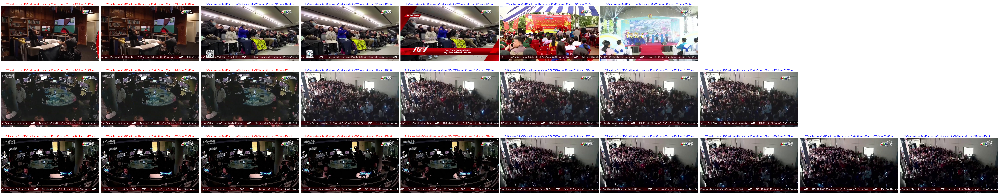

In [13]:
df1['query'] = 'query1'
df2['query'] = 'query2'
img_path = {}
for video_name in df1['video_name'].unique():
    img_path[video_name] = []
    for index, row in df1.iterrows():
        if row['video_name'] == video_name:
            img_path[video_name].append(['query1', 'E:\\Downloads\\atm24949_withsound\\' + row['path']])
    for index, row in df2.iterrows():
        if row['video_name'] == video_name:
            img_path[video_name].append(['query2', 'E:\\Downloads\\atm24949_withsound\\' + row['path']])
show_images_grid(img_path)